In [1]:
import re
import os
import glob
import string
import numpy as np
import pandas as pd
import seaborn as sns
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import anndata
import scanpy as sc
import scanpy.external as sce
from itertools import islice, cycle

import matplotlib
matplotlib.rc('pdf', fonttype=42)

from ALLCools.clustering import tsne, significant_pc_test, filter_regions, remove_black_list_region, lsi, binarize_matrix
from ALLCools.plot import *

In [2]:
metadata=  pd.read_csv("All.Cells.meta.csv", index_col=0)

/tmp/ipykernel_1335235/996962896.py:1: DtypeWarning: Columns (5,45,46,47,48,53,54,55,56,58,59,61,64,66,67,68,69,70,72,123) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata=  pd.read_csv("All.Cells.meta.csv", index_col=0)


# Figure 2A

In [3]:
from matplotlib.colors import rgb2hex
color_plate = sns.color_palette("tab20b")
color_plate = [rgb2hex(x) for x in color_plate]

cell2color = {'B-cell': color_plate[2],
            'B-Mem': color_plate[2],
             'B-Naive': color_plate[3],
             'Monocyte': color_plate[6],
             # 'Monocyte1': color_plate[7],
              'NK-cell': color_plate[10],
             'NK-cell1': color_plate[10],
             'NK-cell2': color_plate[11],
              'Other-cell': 'lightgrey',
             'Tc-Mem': color_plate[14],
             'Tc-Naive': color_plate[15],
             'Th-Mem': color_plate[18],
             'Th-Naive': color_plate[19]}

color_plate = sns.color_palette("Set3", 8)
color_plate = [rgb2hex(x) for x in color_plate]

expo2color = {'HIV': color_plate[0],
              'HIV_pre': color_plate[6],
             'Flu_pos': color_plate[1],
             'Flu_pre': 'gold',
             'COVID_S': color_plate[2],
              'COVID_nS': color_plate[2],
             'MRSA': color_plate[3],
              'MSSA': color_plate[3],
             'BA': color_plate[4],
             'OP': color_plate[5],
             'Ctrl': 'lightgrey'}


B-cell
Monocyte
NK-cell
Other-cell
Tc-Mem
Tc-Naive
Th-Mem
Th-Naive


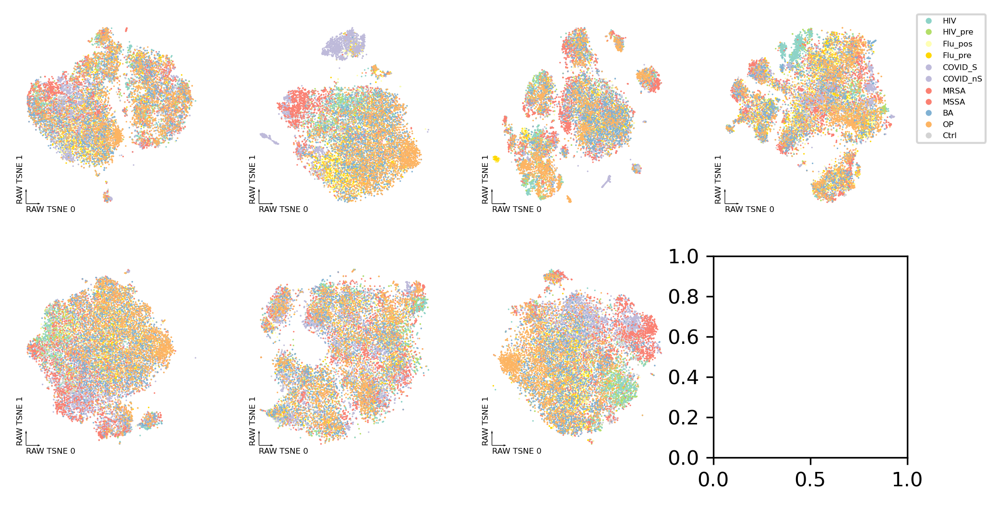

In [5]:
fig, axes = plt.subplots(2, 4, figsize=(8, 4), dpi=300)
axes = axes.flatten()
i = 0
# axes[3].axis('off')
for cell, celldf in metadata.groupby('cell_type'):
    print(cell)
    if cell == 'Other-cell':
        # i+=1
        continue
    # if cell not in major_cells:
    #     continue
    if i == 3:
        legend = True
    else:
        legend = False
    _ = categorical_scatter(data=celldf, ax=axes[i], coord_base='raw_tsne', hue='exposure', show_legend=legend, palette=expo2color)
    i += 1
plt.savefig('Figure2A.embedding.pdf')

# Figure 2B

In [6]:
cell_count = metadata[['raw_leiden', 'exposure']].value_counts().reset_index().rename({0: 'count'}, axis=1)

In [7]:
cell_count['cell_type'] = [re.sub("[0-9]+$", '', x) for x in cell_count['raw_leiden']]

In [8]:
total_counts = cell_count.groupby(['cell_type', 'exposure'])['count'].sum().to_dict()

In [9]:
cell_count['ratio'] = cell_count.apply(lambda row: row['count'] / total_counts[(row.cell_type, row.exposure)], axis=1)

In [10]:
cell_count['state'] = ['Ctrl' if x in ['HIV_pre', 'Flu_pre', 'Ctrl'] else x for x in cell_count['exposure']]

In [11]:
cell_count = cell_count[cell_count['cell_type']!='Other-cell']

In [12]:
exposures = ['Ctrl', 'HIV_pre', 'HIV', 'Flu_pre', 'Flu_pos', 'COVID_nS', 'COVID_S', 'BA', 'MRSA', 'MSSA', 'OP']

subtypes = sorted(cell_count['raw_leiden'].unique())

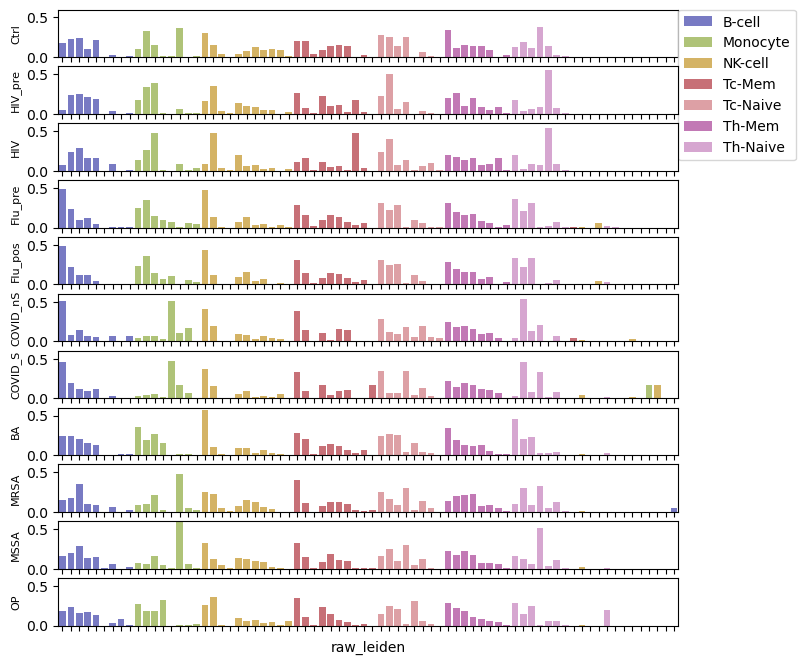

In [13]:
fig, axes = plt.subplots(11, 1, figsize=(8, 8), sharex=True)
for i, expo in enumerate(exposures):
    expo_df = cell_count[cell_count['exposure']==expo].sort_values(by='raw_leiden')

    ax = sns.barplot(expo_df, x='raw_leiden', y='ratio', hue='cell_type', palette=cell2color, ax=axes[i])
    if i == 0:
        ax.legend(loc='upper left', bbox_to_anchor=(1, 1), borderaxespad=0.)
    else:
        ax.legend_.remove()
    ax.set_ylabel(expo, fontsize=8)
    ax.set_ylim(0, 0.6)
plt.gca().set_xticklabels([])
plt.savefig("Figure2B.all.barplot.pdf")

# Figure 2C

In [25]:
internal = cell_count.loc[[x.startswith('Flu') or x.startswith('HIV') for x in cell_count['exposure']]]

In [26]:
internal['cell_type'] = [re.sub("[0-9]+$", '', x) for x in internal['raw_leiden']]

/tmp/ipykernel_1335235/2950151465.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  internal['cell_type'] = [re.sub("[0-9]+$", '', x) for x in internal['raw_leiden']]


In [27]:
internal['state'] = ['pre' if x in ['HIV_pre', 'Flu_pre'] else 'post' for x in internal['exposure']]

/tmp/ipykernel_1335235/4224732188.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  internal['state'] = ['pre' if x in ['HIV_pre', 'Flu_pre'] else 'post' for x in internal['exposure']]


In [28]:
total_counts = internal.groupby(['cell_type', 'exposure'])['count'].sum().to_dict()

In [29]:
internal['ratio'] = internal.apply(lambda row: row['count'] / total_counts[(row.cell_type, row.exposure)], axis=1)

/tmp/ipykernel_1335235/204625118.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  internal['ratio'] = internal.apply(lambda row: row['count'] / total_counts[(row.cell_type, row.exposure)], axis=1)


In [30]:
internal['exposure'] = [re.sub("_.*", '', x) for x in internal['exposure']]

/tmp/ipykernel_1335235/1344834950.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  internal['exposure'] = [re.sub("_.*", '', x) for x in internal['exposure']]


In [31]:
hiv_subtype = internal[internal['exposure'] == 'HIV']

In [32]:
pivot_df = internal.pivot_table(index=['raw_leiden', 'exposure', 'cell_type'], 
                          columns='state', 
                          values='ratio',
                          aggfunc='first').reset_index()


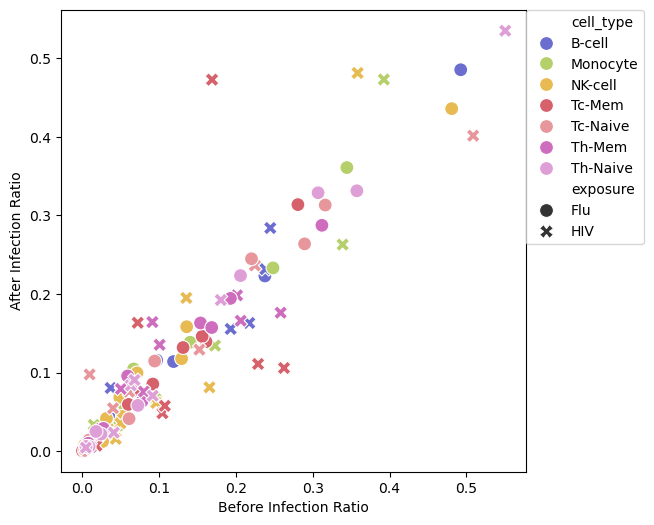

In [33]:
# Create scatter plot
plt.figure(figsize=(6, 6))
scatter = sns.scatterplot(data=pivot_df[pivot_df['cell_type']!='Other-cell'], x='pre', y='post', 
                          hue='cell_type', style='exposure', s=100, palette=cell2color)

# Adding titles and labels
# plt.title('Scatter Plot of Pre vs. Post Ratios')
plt.xlabel('Before Infection Ratio')
plt.ylabel('After Infection Ratio')

# Show plot
plt.legend(title='Cell Type and Exposure')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), borderaxespad=0.)
plt.savefig('Figure2C.internal_proportion.pdf')

# Figure 2D HIV embedding

In [34]:
hiv_meta = pd.read_csv("HIV.metadata.csv")

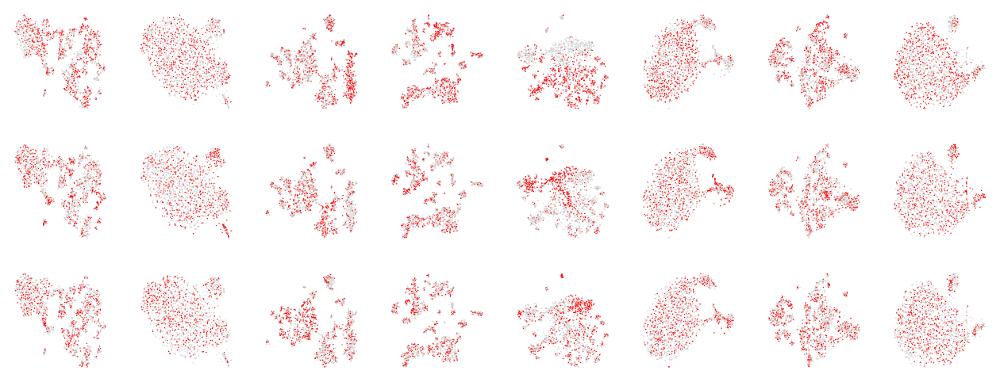

In [35]:
fig, axes = plt.subplots(3, 8, figsize=(16, 6))
cell_types = sorted(hiv_meta['cell_type'].unique())
for i, cell_type in enumerate(cell_types):
    cell_meta = hiv_meta[hiv_meta['cell_type']==cell_type]
    for j, cond in enumerate(['pre', 'acu', 'cro']):
        categorical_scatter(data=cell_meta, ax=axes[j, i], coord_base='HM_tsne', hue=cell_meta['condition'] == cond,
                        axis_format=None, palette={True: 'red', False: 'lightgray'}, s=1)

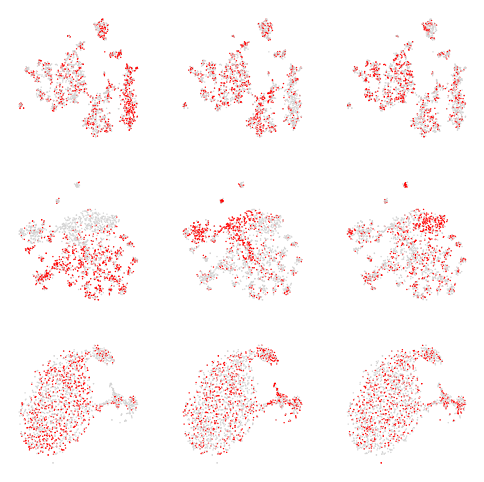

In [38]:
fig, axes = plt.subplots(3, 3, figsize=(6, 6))
cell_types = sorted(hiv_meta['cell_type'].unique())
for i, cell_type in enumerate(['NK-cell', 'Tc-Mem', 'Tc-Naive']):
    cell_meta = hiv_meta[hiv_meta['cell_type']==cell_type]
    for j, cond in enumerate(['pre', 'acu', 'cro']):
        categorical_scatter(data=cell_meta, ax=axes[i, j], coord_base='HM_tsne', hue=cell_meta['condition'] == cond,
                        axis_format=None, palette={True: 'red', False: 'lightgray'}, s=1)
    # continuous_scatter(data=cell_meta, ax=axes[i, j+1], coord_base='HM_tsne', hue='CG_Rate',
    #                     axis_format=None, s=1)
plt.savefig("Figure2D.HIVembedding.pdf")

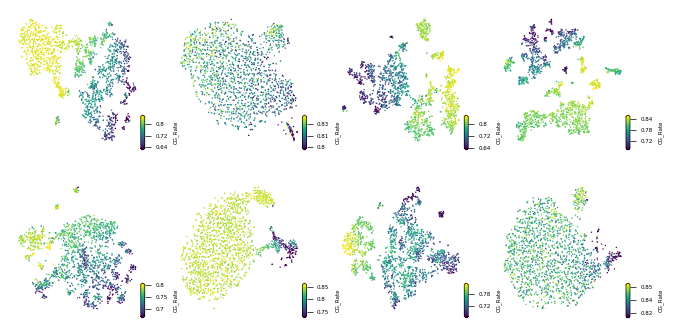

In [39]:
fig, axes = plt.subplots(2, 4, figsize=(8, 4))
axes = axes.flatten()
cell_types = sorted(hiv_meta['cell_type'].unique())
for i, cell_type in enumerate(cell_types):
    cell_meta = hiv_meta[hiv_meta['cell_type']==cell_type]
    continuous_scatter(data=cell_meta, ax=axes[i], coord_base='HM_tsne', hue='CG_Rate',
                        axis_format=None, s=1)
plt.savefig("FigureS3A.HIV.mCGHue.pdf")

## Figure S2

/tmp/ipykernel_1335235/2124154089.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_mcad_obs['exposure'] = [x if x in [this_exposure, other_exposure] + controls else "Other" for x in cell_mcad_obs['exposure']]
/tmp/ipykernel_1335235/2124154089.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_mcad_obs['exposure'] = ['Control' if x in controls else x for x in cell_mcad_obs['exposure']]
/tmp/ipykernel_1335235/2124154089.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

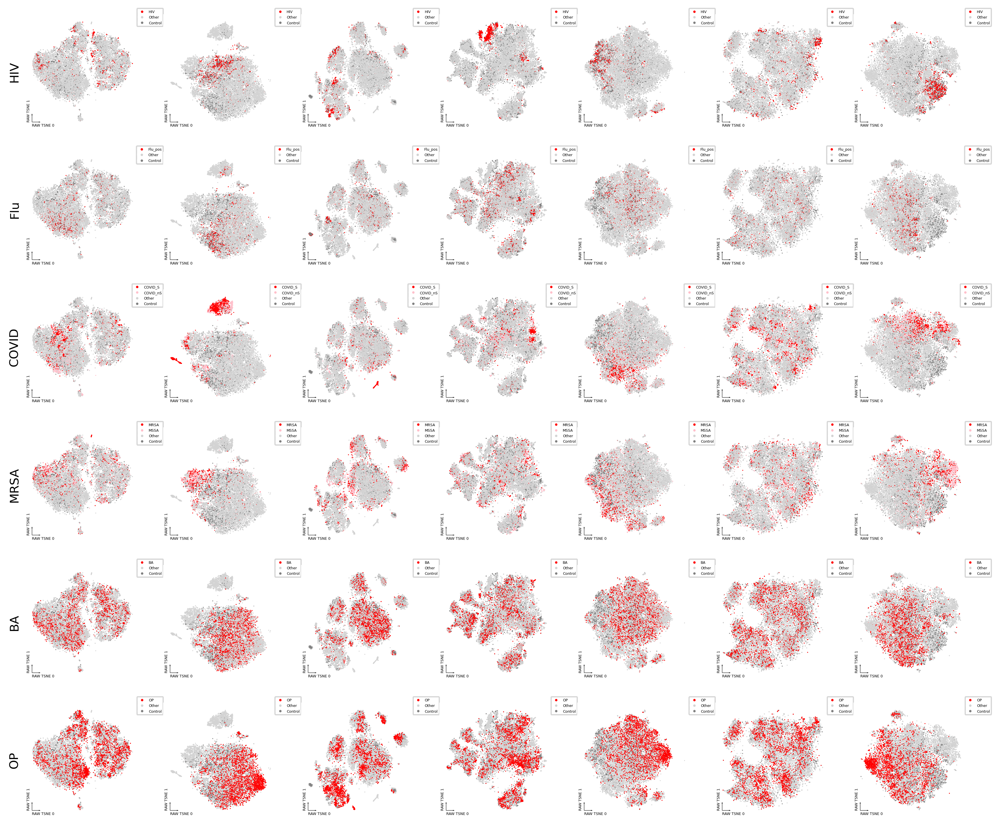

In [43]:
fig, axes = plt.subplots(6, 7, figsize=(14, 12), dpi=300)

cell_types = ['B-cell', 'Monocyte', 'NK-cell', 'Tc-Mem', 'Tc-Naive', 'Th-Mem', 'Th-Naive']
exposures = ['HIV', 'Flu', 'COVID', 'MRSA', 'BA', 'OP']
for i, cell_type in enumerate(cell_types):
    for j, exposure in enumerate(exposures):
        cell_mcad_obs = metadata[metadata['cell_type'] == cell_type]
        other_exposure = ""
        if exposure == 'COVID':
            this_exposure = 'COVID_S'
            other_exposure = 'COVID_nS'
        elif exposure == 'Flu':
            this_exposure = 'Flu_pos'
            other_exposure = 'Flu_pre'
        elif exposure == 'MRSA':
            this_exposure = 'MRSA'
            other_exposure = 'MSSA'
        else:
            this_exposure = exposure
            other_exposure = ''
        controls = ['Ctrl', 'HIV_pre', 'Flu_pre']
        cell_mcad_obs['exposure'] = [x if x in [this_exposure, other_exposure] + controls else "Other" for x in cell_mcad_obs['exposure']]
        cell_mcad_obs['exposure'] = ['Control' if x in controls else x for x in cell_mcad_obs['exposure']]
        _ = categorical_scatter(data=cell_mcad_obs, ax=axes[j, i], coord_base='raw_tsne', hue='exposure', show_legend=True, labelsize=3, legend_kws={'loc':1,'bbox_to_anchor':(1.2, 1.05)}, palette={this_exposure:'red', other_exposure:'pink', 'Other':'lightgray', 'Control': 'grey'})
        
        if i==0:
            axes[j, i].set_ylabel(exposure)
plt.savefig("FigureS2.exposure_clusters.pdf")

# Figure 2E

## Step1. read DMGs from one versus rest

In [40]:
hdffiles = glob.glob("/gale/netapp/DoD/wenliang/projects/01.HIV/05.clustering/*DMG.hdf")
dmg_list = list()
for file in hdffiles:
    celltype = re.sub('.OneVsRestDMG.hdf', '', os.path.basename(file))
    if celltype == 'Other-cell' or celltype in cell_types:
        continue
    dmg_df = pd.read_hdf(file)
    dmg_list.append(dmg_df)

In [41]:
dmg_df = pd.concat(dmg_list)

In [45]:
gene_meta_path = '/gale/netapp/DoD/wenliang/database/ref/hg38/Annotation/gencode.v35.annotation.gene.withName.bed'
gene_meta = pd.read_csv(gene_meta_path, sep='\t', names=['chrom', 'start', 'end', 'gene_id', 'gene_name'], index_col=3)
gene2name = dict(zip(gene_meta.index, gene_meta['gene_name']))

In [46]:
dmg_df['Gene'] = [gene2name[x] if x in gene2name else x for x in dmg_df.index]

In [47]:
dmg_df['cell_type'] = [re.sub("[0-9]+$", '', x) for x in dmg_df['cluster']]

In [49]:
sig_dmgs = dmg_df[dmg_df['pvals_adj']< 0.00001]

In [53]:
sig_dmgs.to_csv('sig_dmgs.tsv', sep="\t", index=False)

### these DMGs were uploaded to metascape.org for enrichment

## Step3. condition enrichment in subclusters

In [57]:
from scipy.stats import fisher_exact, chi2_contingency

In [58]:
count_df = hiv_meta[['HM_leiden', 'condition', 'cell_type']].value_counts().reset_index()

In [59]:
count_df = count_df.rename({0: 'count'}, axis=1)

In [60]:
leiden2group = defaultdict(list)
enrich_odds_p = defaultdict(list)
for cell, celldf in count_df.groupby('cell_type'):
    for leiden in celldf['HM_leiden'].unique():
        for cond in ['pre','acu', 'cro']:
            cond_count = celldf.loc[(celldf['condition']==cond) & (celldf['HM_leiden']==leiden), 'count'].sum()
            cond_other = celldf.loc[(celldf['condition']==cond) & (celldf['HM_leiden']!=leiden), 'count'].sum()
            other_count = celldf.loc[(celldf['condition']!=cond) & (celldf['HM_leiden']==leiden), 'count'].sum()
            other_other = celldf.loc[(celldf['condition']!=cond) & (celldf['HM_leiden']!=leiden), 'count'].sum()
            all_count = np.array([
                        [cond_count, cond_other],
                        [other_count, other_other]])
            odds, p_value = fisher_exact(all_count)
            enrich_odds_p['leiden'].append(leiden)
            enrich_odds_p['condition'].append(cond)
            enrich_odds_p['pvalue'].append(p_value)
            enrich_odds_p['odds'].append(odds)
            if odds > 0 and p_value < 0.01:
                leiden2group[leiden].append(cond)

In [61]:
import statsmodels.stats.multitest as smm

In [62]:
enrich_odds_p_df = pd.DataFrame.from_dict(enrich_odds_p)

In [63]:
rejected, p_adjusted, _, _ = smm.multipletests(enrich_odds_p_df['pvalue'], alpha=0.05, method='fdr_bh')

enrich_odds_p_df['fdr'] = p_adjusted

enrich_odds_p_df['-log10(FDR)'] = -np.log10(enrich_odds_p_df['fdr'])
enrich_odds_p_df['log2(odds_ratio)'] = np.log2(enrich_odds_p_df['odds'])
enrich_odds_p_df['celltype'] = [re.sub("[0-9]+$", '', x) for x in enrich_odds_p_df['leiden']]

enrich_odds_p_df = enrich_odds_p_df[enrich_odds_p_df['celltype']!='Other-cell']

enrich_odds_p_df = enrich_odds_p_df[enrich_odds_p_df['fdr'] < 0.05]

enrich_odds_p_df.to_csv('enrich_odds_p.csv', index=False)

## Step4. Performe GO enrichment

In [70]:
sig_dmgs = pd.read_csv('sig_dmgs.tsv', sep="\t")

In [71]:
enrich_odds_p_df = pd.read_csv("enrich_odds_p.csv")

In [74]:
enriched_dmg = dmg_df[dmg_df['cluster'].isin(enrich_odds_p_df['leiden'])]

In [99]:
enriched_dmg.to_csv('sig_enriched_dmg.csv', index=False)

#### these DMGs were uploaded to metascape.org for functional enrichment

## Step5. Plot joint plot of DMG GO enrichment and condition enrichment in the clusters

In [100]:
sig_terms = pd.read_csv("HIVdmg.enrich.heatmap.csv")

In [101]:
sig_terms.columns = [re.sub('_LogP_', '',x) for x in sig_terms.columns]

In [102]:
sig_terms = sig_terms.melt(value_name='log(Pvalue)', id_vars=['GO', 'Description'], var_name='leiden')

In [104]:
sig_terms['-log(Pvalue)'] = -1 * sig_terms['log(Pvalue)']

In [105]:
from PyComplexHeatmap import *

In [106]:
df_col = enrich_odds_p_df[['leiden', 'celltype']].drop_duplicates().set_index('leiden')
x_order = df_col.index.tolist()
col_order = df_col.celltype.unique().tolist()

In [107]:
enrich_odds_p_df['log2(odds_ratio)'] = [2 if x > 2 else -2 if x < -2 else x for x in enrich_odds_p_df['log2(odds_ratio)']]

In [111]:
sig_terms_mat = sig_terms.pivot(index='Description', columns='leiden', values="-log(Pvalue)")

In [112]:
for leiden in x_order:
    if leiden not in sig_terms_mat.columns:
        sig_terms_mat[leiden] = 0

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Plotting legends..


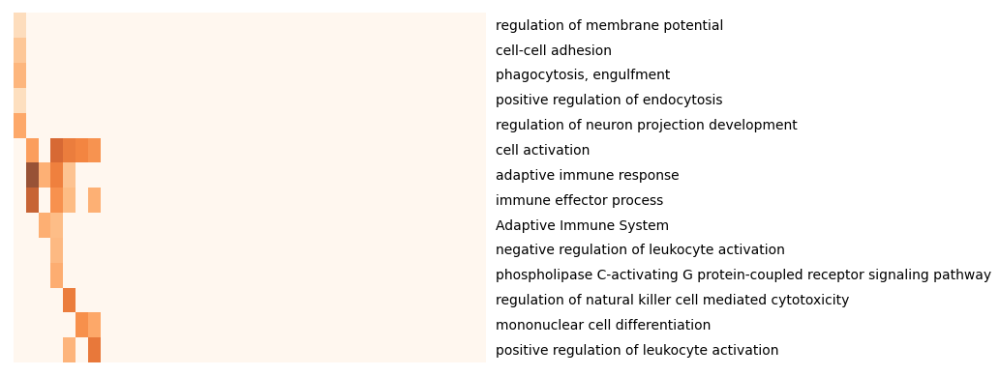

<Figure size 1200x600 with 0 Axes>

In [113]:
col_ha2 = HeatmapAnnotation(Exposure=anno_simple(df_col.celltype,cmap='Set1',colors=cell2color, legend=False,add_text=True),
                           verbose=0)

cm1 = ClusterMapPlotter(data=sig_terms_mat, cmap='Oranges',
                           row_cluster=True,col_cluster=False, 
                          col_split_gap=1,
                          show_rownames=True,show_colnames=False,row_dendrogram=False, plot=True,
                          verbose=1,legend_gap=7,alpha=0.8)

plt.figure(figsize=(12,6))
cm2 = DotClustermapPlotter(data=enrich_odds_p_df, x='leiden',y='condition',s='-log10(FDR)',value='log2(odds_ratio)',cmap='PiYG_r',c='log2(odds_ratio)',
                           row_cluster=True,col_cluster=False,x_order=x_order,
                          bottom_annotation=col_ha2, 
                           col_split=df_col.celltype, col_split_order=col_order,
                          col_split_gap=1,max_s=100,
                           grid='minor',
                          show_rownames=True,show_colnames=False,row_dendrogram=False,plot=False,
                          verbose=1,legend_gap=7)
# plt.savefig('Figure2C.leiden.enrich.pdf')
cmlist = [cm1, cm2]
plt.show()

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Using user provided max_s: 100
Starting plotting..
Starting calculating row orders..
Reordering rows..
Plotting matrix..
Estimated legend width: 28.22361111111111 mm


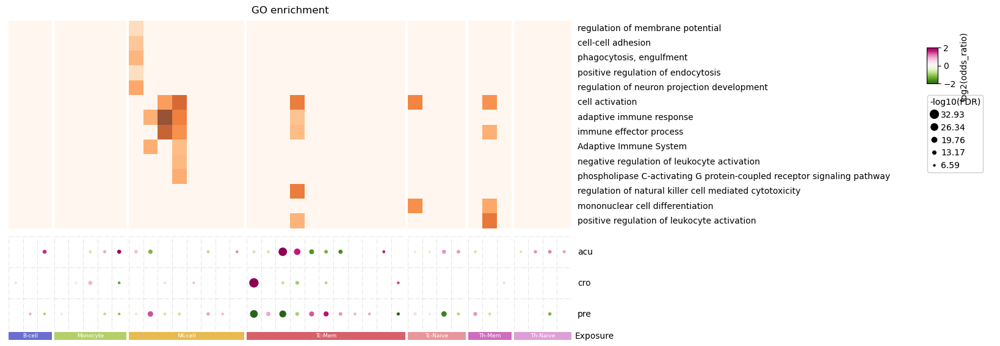

In [114]:
plt.figure(figsize=(12,6))
ax,legend_axes=composite(cmlist=cmlist, row_gap = 1, main=1,  axis=0, height_ratios=[4, 2])
cm1.post_processing()
cm2.post_processing()
cm1.ax.set_title("GO enrichment")
# ax.set_title("Influence of SNP on DNAm reading",y=1.03,fontdict={'fontweight':'bold','color':'red'})
# plt.savefig("beta_snp.pdf", bbox_inches='tight')
plt.savefig('Figure2E.MarkerEnrich.pdf')

## Figure 2F

In [116]:
covid_meta = pd.read_csv("COVID.meta.csv")

In [121]:
from matplotlib.colors import rgb2hex

color_plate = sns.color_palette("Accent")
color_plate = [rgb2hex(x) for x in color_plate]

cell2color = {'Monocyte_r': color_plate[0],
             'Monocyte1_r': color_plate[1]}

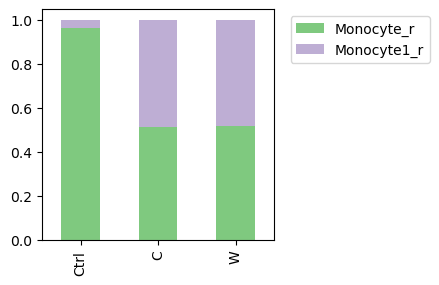

In [122]:
colors = sns.color_palette("tab10")

count_list = list()
fig, ax = plt.subplots(1,1, figsize=(3,3))
for i, celltype in enumerate(['Monocyte']):
    cell_df = covid_meta[covid_meta['cell_type'] == celltype]
    count_dict = cell_df[['condition', 'annotation']].value_counts().to_dict()
    
    cell_counter = defaultdict(Counter)
    for (cond, cell) in count_dict:
        if count_dict[(cond, cell)] < 50:
            continue
        cell_counter[cond][cell] = count_dict[(cond, cell)]
        cell_counter[cond]['total'] += count_dict[(cond, cell)]
    cell_counter_df = pd.DataFrame.from_dict(cell_counter, orient='index')
    count_list.append(cell_counter_df)
    for cell in cell_counter_df.columns:
        if cell == 'total':
            continue
        cell_counter_df[f'{cell}_r'] = cell_counter_df.apply(lambda row: row[cell] / row['total'], axis=1)
    ax = cell_counter_df[[x for x in cell_counter_df.columns if x.endswith("_r")]].loc[['Ctrl','C','W']].plot.bar(stacked=True, ax=ax, color=cell2color)
    ax.legend(bbox_to_anchor=(1.04,1), loc="upper left")
plt.savefig('Figure2F.COVID_Monocyte_ratio.pdf')

In [123]:
from scipy.stats import chi2_contingency

In [125]:
data_df = pd.concat(count_list, axis=1)

In [126]:
chi2_contingency(data_df.loc[['Ctrl', 'W', 'C'], ['Monocyte', 'Monocyte1']])

Chi2ContingencyResult(statistic=1279.6884555942231, pvalue=1.3157779073289763e-278, dof=2, expected_freq=array([[1968.8138455 ,  615.1861545 ],
       [ 857.16547066,  267.83452934],
       [ 784.02068383,  244.97931617]]))

## Figure 2G

#### Monocytes.DMG.metascape.txt file were uploaded to metascape.org to projduce the heatmap

## 

In [179]:
row_filter = metadata.index.to_series().apply(lambda x: not x.startswith('Flu') and not x.endswith('pre'))

# Correctly apply row filter and check 'subgroup' and 'Cohort' within .loc using row_filter
ctrl_meta = metadata.loc[row_filter]
ctrl_meta = ctrl_meta[(ctrl_meta['subgroup'] == 'Ctrl') & (ctrl_meta['Cohort'] == 'Ctrl')]

In [180]:
ctrl_meta

,cell,batch,index_name,MultiplexReadsTotal,IndexReadsTotal,IndexReadsRatio,IndexBpTotal,IndexTrimedBpTotal,IndexTrimedReadsTotal,ReadsQualTrimBpTotal,...,Day,Donor,uid,Age,Cohort,mCG_level,mCH_level,Frequency,Level,subgroup
cell,,,,,,,,,,,,,,,,,,,,,
Ctrl_1_Rep_1-Ctrl_2_Rep_1-A1-AD002,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A1-AD002,NaN,ad002,9105318.0,2381584.0,26.155967,347108903.0,298295755.0,2349306.0,734670.0,...,NaN,NaN,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A1,35-65,Ctrl,0.807901,0.004859,NaN,NaN,Ctrl
Ctrl_1_Rep_1-Ctrl_2_Rep_1-A1-AD008,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A1-AD008,NaN,ad008,9105318.0,2929868.0,32.177547,423747846.0,363426815.0,2865758.0,879129.0,...,NaN,NaN,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A1,35-65,Ctrl,0.624202,0.005594,NaN,NaN,Ctrl
Ctrl_1_Rep_1-Ctrl_2_Rep_1-A1-AD012,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A1-AD012,NaN,ad012,9105318.0,2636030.0,28.950444,386388978.0,332693187.0,2620288.0,754279.0,...,NaN,NaN,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A1,35-65,Ctrl,0.806509,0.005565,NaN,NaN,Ctrl
Ctrl_1_Rep_1-Ctrl_2_Rep_1-A10-AD002,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A10-AD002,NaN,ad002,10266238.0,4407274.0,42.929786,644986021.0,554945140.0,4367320.0,1339497.0,...,NaN,NaN,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A10,35-65,Ctrl,0.794335,0.005711,NaN,NaN,Ctrl
Ctrl_1_Rep_1-Ctrl_2_Rep_1-A10-AD008,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A10-AD008,NaN,ad008,10266238.0,4065432.0,39.600017,589680126.0,506155456.0,3986735.0,1193388.0,...,NaN,NaN,Ctrl_1_Rep_1-Ctrl_2_Rep_1-A10,35-65,Ctrl,0.846823,0.006726,NaN,NaN,Ctrl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ctrl_14_2-Ctrl_15_2-E8-AD006,Ctrl_14_2-Ctrl_15_2-E8-AD006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,>65,Ctrl,0.769500,0.009259,NaN,NaN,Ctrl
Ctrl_14_2-Ctrl_15_2-E8-AD007,Ctrl_14_2-Ctrl_15_2-E8-AD007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,>65,Ctrl,0.755906,0.007206,NaN,NaN,Ctrl
Ctrl_14_2-Ctrl_15_2-E8-AD008,Ctrl_14_2-Ctrl_15_2-E8-AD008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,>65,Ctrl,0.692419,0.007778,NaN,NaN,Ctrl


In [166]:
ctrl_meta

,cell,batch,index_name,MultiplexReadsTotal,IndexReadsTotal,IndexReadsRatio,IndexBpTotal,IndexTrimedBpTotal,IndexTrimedReadsTotal,ReadsQualTrimBpTotal,...,Day,Donor,uid,Age,Cohort,mCG_level,mCH_level,Frequency,Level,subgroup
13698,HIV_1_R1_A0_Other-cell_pre,NaN,ad001,34255590.0,4031068.0,11.767621,579804493.0,496571353.0,3920896.0,1127041.0,...,NaN,NaN,NaN,NaN,Ctrl,0.840773,0.006099,NaN,NaN,Ctrl
13699,HIV_1_R1_B0_Other-cell_pre,NaN,ad002,34255590.0,5012910.0,14.633845,720556253.0,616844650.0,4864419.0,1414577.0,...,NaN,NaN,NaN,NaN,Ctrl,0.809248,0.007902,NaN,NaN,Ctrl
13700,HIV_1_R1_A1_Other-cell_pre,NaN,ad004,34255590.0,5243094.0,15.305806,754961219.0,646710720.0,5103260.0,1400092.0,...,NaN,NaN,NaN,NaN,Ctrl,0.732884,0.006340,NaN,NaN,Ctrl
13701,HIV_1_R1_B1_Other-cell_pre,NaN,ad006,34255590.0,5587534.0,16.311306,798640481.0,682753797.0,5390298.0,1497622.0,...,NaN,NaN,NaN,NaN,Ctrl,0.824214,0.007307,NaN,NaN,Ctrl
13702,HIV_1_R1_A18_Other-cell_pre,NaN,ad001,22259358.0,3436418.0,15.438082,495537925.0,424492938.0,3357457.0,1220161.0,...,NaN,NaN,NaN,NaN,Ctrl,0.845329,0.007585,NaN,NaN,Ctrl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36034,Flu_9_1-6-M14-O12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Ctrl,0.829508,0.009501,NaN,NaN,Ctrl
36035,Flu_9_1-6-M14-O23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Ctrl,0.842103,0.008347,NaN,NaN,Ctrl
36036,Flu_9_1-6-M14-O24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Ctrl,0.805909,0.008688,NaN,NaN,Ctrl
36037,Flu_9_1-6-M14-P12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Ctrl,0.840051,0.010835,NaN,NaN,Ctrl


In [164]:
other_meta = metadata[metadata['subgroup']!='Ctrl']

In [165]:
other_meta

,cell,batch,index_name,MultiplexReadsTotal,IndexReadsTotal,IndexReadsRatio,IndexBpTotal,IndexTrimedBpTotal,IndexTrimedReadsTotal,ReadsQualTrimBpTotal,...,Day,Donor,uid,Age,Cohort,mCG_level,mCH_level,Frequency,Level,subgroup
0,HIV_1_R1_A0_Other-cell_pre,0.0,ad001,34255590.0,4031068.0,11.767621,579804493.0,496571353.0,3920896.0,1127041.0,...,NaN,NaN,NaN,NaN,NaN,1.681547,NaN,NaN,NaN,pre
1,HIV_1_R1_B0_Other-cell_pre,0.0,ad002,34255590.0,5012910.0,14.633845,720556253.0,616844650.0,4864419.0,1414577.0,...,NaN,NaN,NaN,NaN,NaN,1.618495,NaN,NaN,NaN,pre
2,HIV_1_R1_A1_Other-cell_pre,0.0,ad004,34255590.0,5243094.0,15.305806,754961219.0,646710720.0,5103260.0,1400092.0,...,NaN,NaN,NaN,NaN,NaN,1.465768,NaN,NaN,NaN,pre
3,HIV_1_R1_B1_Other-cell_pre,0.0,ad006,34255590.0,5587534.0,16.311306,798640481.0,682753797.0,5390298.0,1497622.0,...,NaN,NaN,NaN,NaN,NaN,1.648429,NaN,NaN,NaN,pre
4,HIV_3_R1_A0_Other-cell_cro,0.0,ad007,34255590.0,4367786.0,12.750579,633609127.0,544084360.0,4294245.0,1151022.0,...,NaN,NaN,NaN,NaN,NaN,1.689540,NaN,NaN,NaN,cro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16897,OP_16_2-2-P7-O16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,46,NaN,0.839794,NaN,NaN,Low,Low
16898,OP_16_2-2-P7-O3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,46,NaN,0.835722,NaN,NaN,Low,Low
16899,OP_16_2-2-P7-P15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,46,NaN,0.833942,NaN,NaN,Low,Low
16900,OP_16_2-2-P7-P16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,46,NaN,0.840551,NaN,NaN,Low,Low


In [181]:
nodup_meta = pd.concat([ctrl_meta, other_meta])

In [188]:
combined_meta = dict()
combined_meta['subgroup'] = dict(zip(nodup_meta.index, nodup_meta['subgroup']))
combined_meta['annotation'] = dict(zip(nodup_meta.index, nodup_meta['annotation']))
combined_meta['exposure'] = dict(zip(nodup_meta.index,  nodup_meta['exposure']))
combined_meta['age'] = dict(zip(nodup_meta.index, nodup_meta['Age']))
combined_meta['sex'] = dict(zip(nodup_meta.index, nodup_meta['Sex']))
combined_meta['mCG'] = dict(zip(nodup_meta.index, nodup_meta['mCG_level']))

In [189]:
combined_meta_df = pd.DataFrame.from_dict(combined_meta)

In [278]:
combined_meta_df['subgroup'].value_counts()

subgroup
High    11285
Ctrl     7583
Med      3754
Low      1863
D1       1291
D28      1137
Name: count, dtype: int64

In [130]:
combined_meta_df['exposure'] = combined_meta_df.apply(lambda row: 'HIV' if row.condition in ['acu', 'cro'] else 'HIV_pre' if row.condition=='pre' else 'Flu_pre' if row.condition == 'D1' else 'Flu' if row.condition=='D28' else 'COVID' if row.condition in ['C','W'] else 'MRSA' if row.condition in ['MRSA', 'MSSA'] else 'OP' if row.condition \
                                                     in ['Low', 'Med', 'High'] else 'BA' if row.condition in ['frequent', 'unfrequent'] else 'Ctrl', axis=1)

In [131]:
combined_meta_df[['exposure', 'condition']].value_counts()

exposure  condition 
Ctrl      Ctrl          22341
OP        High          11285
Flu       D28            9593
BA        unfrequent     9258
COVID     W              8525
          C              8012
MRSA      MSSA           7455
BA        frequent       7414
MRSA      MRSA           6243
HIV       acu            4590
          cro            4508
OP        Med            3754
          Low            1863
Flu_pre   D1               35
Name: count, dtype: int64

In [75]:
mcad.write_h5ad('annotated_adata.raw.h5ad')

In [80]:
mcad = sc.read_h5ad('annotated_adata.raw.h5ad')

In [82]:
mcad.strings_to_categoricals()

In [100]:
mcad.obs = pd.concat([mcad.obs, combined_meta_df], axis=1)

In [107]:
mcad.obs.groupby('annotation').count()

,batch,test,condition,exposure,age,sex,mCG
annotation,,,,,,,
B-Mem,6583,6583,6583,759,3775,4944,6583
B-Naive,6980,6980,6980,443,3591,4256,6980
B-cell,499,499,499,20,232,261,499
Monocyte,11711,11711,11711,1062,6598,8252,11711
Monocyte1,1205,1205,1205,0,0,0,1205
NK-cell,2290,2290,2290,190,1327,1645,2290
NK-cell1,3527,3527,3527,620,1989,2889,3527
NK-cell2,8215,8215,8215,505,4517,5309,8215
Other-cell,4043,4043,4043,917,1997,3516,4043


In [95]:
for col in combined_meta_df:
    annotated_adata.obs[col]=annotated_adata.obs_names.map(combined_meta_df[col].to_dict())

/tmp/ipykernel_4119705/3334955917.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  annotated_adata.obs[col]=annotated_adata.obs_names.map(combined_meta_df[col].to_dict())


ValueError: Output dtype not compatible with inputs.

In [94]:
annotated_adata.obs = pd.concat([annotated_adata.obs, combined_meta_df], axis=1)

ValueError: Output dtype not compatible with inputs.

In [ ]:
annotated_adata.obs['annotation'] = [id2cell[x] for x in annotated_adata.obs_names]

In [ ]:
annotated_adata.obs

In [ ]:
annotated_adata.write_h5ad('annotated_adata